# RhyAn Package preview

Written By Kaveen Rodrigo

In [1]:
from __future__ import print_function

In [2]:
#MOVE TO PARENT
import sys,os
sys.path.insert(1, os.path.join(sys.path[0], '..'))

In [3]:
# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
import librosa
import numpy as np

ms.use('seaborn-muted')

# and IPython.display for audio output
import IPython.display

%matplotlib inline

plt.rcParams["figure.figsize"] = (20,10)

In [4]:
def audShow(y):
    IPython.display.display(IPython.display.Audio(data=y, rate=sr))
    
def formatClusters(profiles):
    clusters = []
    for index,compo in enumerate(profiles):
        for frame in compo.frames:
            clusters.append([frame,index])
    return np.array(clusters)

def scatterView(clusters,title):
    plt.figure()
    plt.scatter(clusters[:, 0], clusters[:, 1])
    plt.title(title)

## Load RhyAn library

The algorithm is split up into multiple modules, imported below

In [5]:
import RhyAn.decomposer as rhy_decomposer
import RhyAn.component_filter as rhy_filter
import RhyAn.onset_detector as rhy_detect
import RhyAn.profile_analysis as rhy_analysis 

## Load Audio File 

Load audiofile, and preview

In [6]:
audio_path = "../sample_audio/busyhead.mp3"
y, sr = librosa.load(audio_path,offset=24, duration=20)

In [7]:
audShow(y)

## Decompose Audio Signal

Take audio singal and split it into sub components

In [8]:
decomposer = rhy_decomposer.MedianNMF(y,sr)
components = decomposer.decompose()

In [9]:
for comp in components : audShow(comp)

## Filter Splitted Components 

Perfrom bandpass filtering on components

In [10]:
filtered_components = rhy_filter.FundementalBandPass(components,sr).apply()

In [11]:
for comp in filtered_components : audShow(comp)

## Extract Precussive Hits

Take induvidual audio components and trasncribe it's hits

In [12]:
profiles = rhy_detect.BasicOnSet(filtered_components,sr).apply()

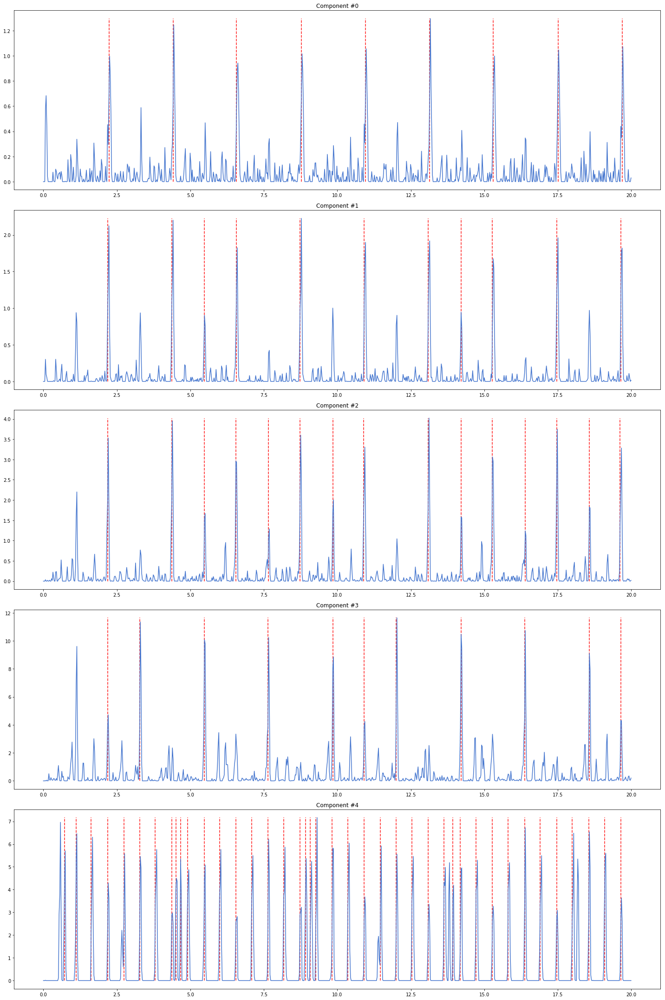

In [13]:
plt.figure(figsize=(20, 30))
for count,i in enumerate(profiles):
    times = librosa.frames_to_time(np.arange(len(i['onset_e'])), sr=sr)
    plt.subplot(len(profiles),1,count+1)
    plt.plot(times, i['onset_e'], label='Onset strength')
    plt.vlines(times[i['onset_frames']], 0, i['onset_e'].max(), color='r', alpha=0.9,
               linestyle='--', label='Onsets')
    plt.axis('tight')
    plt.title('Component #{}'.format(count))
plt.tight_layout() 

### Extracted Components

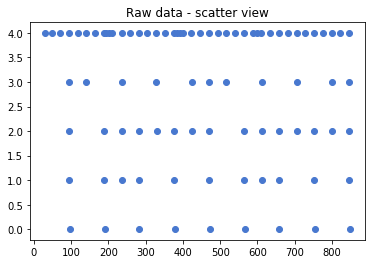

In [14]:
scatterView(formatClusters(profiles),"Raw data - scatter view")

## Remove duplicates and merge similar patterns

Will take n number of components and eleiminate recurring patterns 

In [15]:
clustered_profiles = rhy_analysis.ClusterProfiles(profiles).apply()

In [16]:
# scatterView(formatClusters([x[0] for x in clustered_profiles]),"post-cluster view")

In [17]:
merged_profiles = rhy_analysis.MergeProfiles(clustered_profiles).apply()

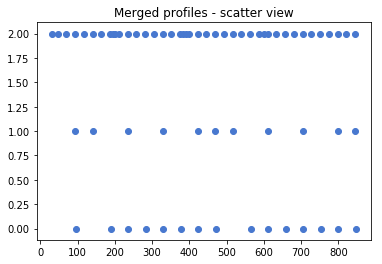

In [18]:
scatterView(formatClusters(merged_profiles),"Merged profiles - scatter view")

## Extract Most common pattern from a pre-trasnscibed track

Load audio data file and extract the most common pattern

In [19]:
import json
from RhyAn import AudioData

In [20]:
name="busyhead"

profile_file = open("../sample_audio/{}.json".format(name),"r").read()
data = AudioData(json.loads(profile_file))

In [21]:
common_slice, keys = rhy_analysis.DTWExtractor(data).getCommonBar(send_key=True)

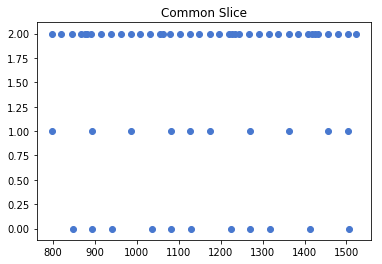

In [22]:
scatterView(formatClusters(common_slice),"Common Slice")


# Preview of fully trasnscibed track and It's common pattern

Shown below is a fully trasnscibed track and representation of the extracted hits and the common pattern  

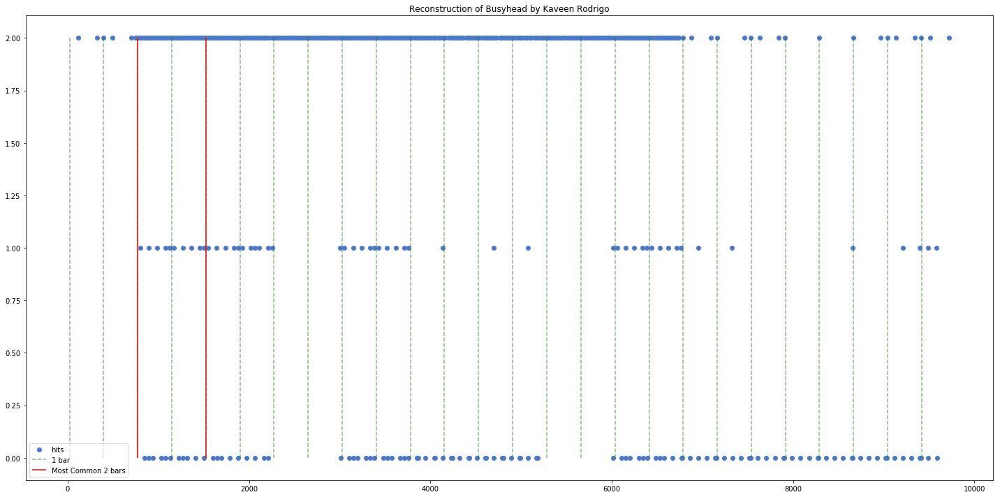

In [23]:
clus = formatClusters(data.getProfiles())

plt.figure()
plt.figure(figsize=(20, 10))
plt.scatter(clus[:, 0], clus[:, 1],label='hits')
plt.vlines(data["beats"][::16], 0, 2, alpha=0.5, color='g', linestyle='--', label='1 bar')
plt.vlines(keys, 0, 2, color='r', linestyle='-', label='Most Common 2 bars')
plt.title("Reconstruction of {} by {}".format(data.title,data.artist))
plt.legend(frameon=True, framealpha=0.75)
plt.tight_layout()